# Mobile Price Prediction using Regression Techniques

------------------

# Table of Contents
* [1. Import the necessary Libraries](#1.-Import-the-necessary-Libraries)
* [2. Load and About Dataset](#2.-Load-and-About-Dataset)
* [3. Exploratory Data Analysis(EDA)](#3.-Exploratory-Data-Analysis(EDA))  
* [4. Data Preprocessing](#4.-Data-Preprocessing)
	* [4.1 Drop unnecessary columns](#4.1-Drop-unnecessary-columns)
	* [4.2 Dealing-with-missing-values](#4.2-Dealing-with-missing-values)
    * [4.3 Modify Variables(Feature Engineering)](#4.3-Modify-Variables(Feature-Engineering))
    * [4.4 Handling Categorical Data](#4.4-Handling-Categorical-Data)
    * [4.5 Feature Selection](#4.5-Feature-Selection)
    * [4.6 Feature Importance](#4.6-Feature-Importance)
    * [4.7 Dealing with outliers](#4.2-Dealing-with-outliers)
    * [4.8 Transform the data](#4.2-Transform-the-data)    
* [5. Pipeline.py file-Sagemaker Pipeline](#5.-Pipeline.py-file---Sagemaker-Pipeline)
	* [5.1 Define a Step to data ingestion](#5.1-Define-a-Step-to-data-ingestion)
    * [5.2 Define a preprocess Step to preprocessing](#5.2-Define-a-preprocess-Step-to-preprocessing)
    * [5.3 Define a Training Step to Train a Model](#5.3-Define-a-Training-Step-to-Train-a-Model)
    * [5.4 Define a Create Model Step to Create a Model](#5.4-Define-a-Create-Model-Step-to-Create-a-Model)
    * [5.5 Define a Transform Step to Perform Batch Transformation](#5.5-Define-a-Transform-Step-to-Perform-Batch-Transformation)
    * [5.6 Define a Register Model Step to Create a Model Package](#5.6-Define-a-Register-Model-Step-to-Create-a-Model-Package)
    * [5.7 Define a Post-Processing Step](#5.7-Define-a-Post-Processing-Step)
    * [5.8 Define a Write Back to Snowflake Step](#5.8-Define-a-Write-Back-to-Snowflake-Step)
    * [5.9 Define steps of the pipeline](#5.9-Define-steps-of-the-pipeline)
    * [5.10 View, Track, and Execute SageMaker Pipelines in SageMaker Studio](#5.10-View,-Track,-and-Execute-SageMaker-Pipelines-in-SageMaker-Studio)
    * [5.11 Structure of pipeline folder](#5.11-Structure-of-pipeline-folder)

## 1. Import the necessary Libraries

In [64]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

## 2. Load and About Dataset

In [65]:
df = pd.read_csv("data/data.csv")

In [66]:
df.head()

,Unnamed: 0,Brand me,Ratings,RAM,ROM,Mobile_Size,Primary_Cam,Selfi_Cam,Battery_Power,Price
0,0,"LG V30+ (Black, 128 )",4.3,4.0,128.0,6.00,48,13.0,4000,24999
1,1,I Kall K11,3.4,6.0,64.0,4.50,48,12.0,4000,15999
2,2,Nokia 105 ss,4.3,4.0,4.0,4.50,64,16.0,4000,15000
3,3,"Samsung Galaxy A50 (White, 64 )",4.4,6.0,64.0,6.40,48,15.0,3800,18999
4,4,"POCO F1 (Steel Blue, 128 )",4.5,6.0,128.0,6.18,35,15.0,3800,18999


##### Independent Features
* Unnamed: 0 - Index column and this is an unnecessary column
* Brand me — Brand of the mobile phone and the model.
* Ratings — Consumer rating for the mobile phone
* RAM — RAM size of the mobile
* ROM — ROM (Internal Memory) size of the mobile
* Mobile_Size — Size of the mobile in inches
* Primary_Cam — Pixel size of the back camera
* Selfi_Cam — Pixel size of the front/selfi camera
* Battery_Power — Battery capacity of the mobilr in mAh

##### Dependent Features
* Price — Price of the mobile

In [264]:
df.shape

(836, 10)

In [265]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 836 entries, 0 to 835
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     836 non-null    int64  
 1   Brand me       836 non-null    object 
 2   Ratings        805 non-null    float64
 3   RAM            829 non-null    float64
 4   ROM            832 non-null    float64
 5   Mobile_Size    834 non-null    float64
 6   Primary_Cam    836 non-null    int64  
 7   Selfi_Cam      567 non-null    float64
 8   Battery_Power  836 non-null    int64  
 9   Price          836 non-null    int64  
dtypes: float64(5), int64(4), object(1)
memory usage: 65.4+ KB


## 3. Exploratory Data Analysis(EDA)

<Figure size 720x720 with 0 Axes>

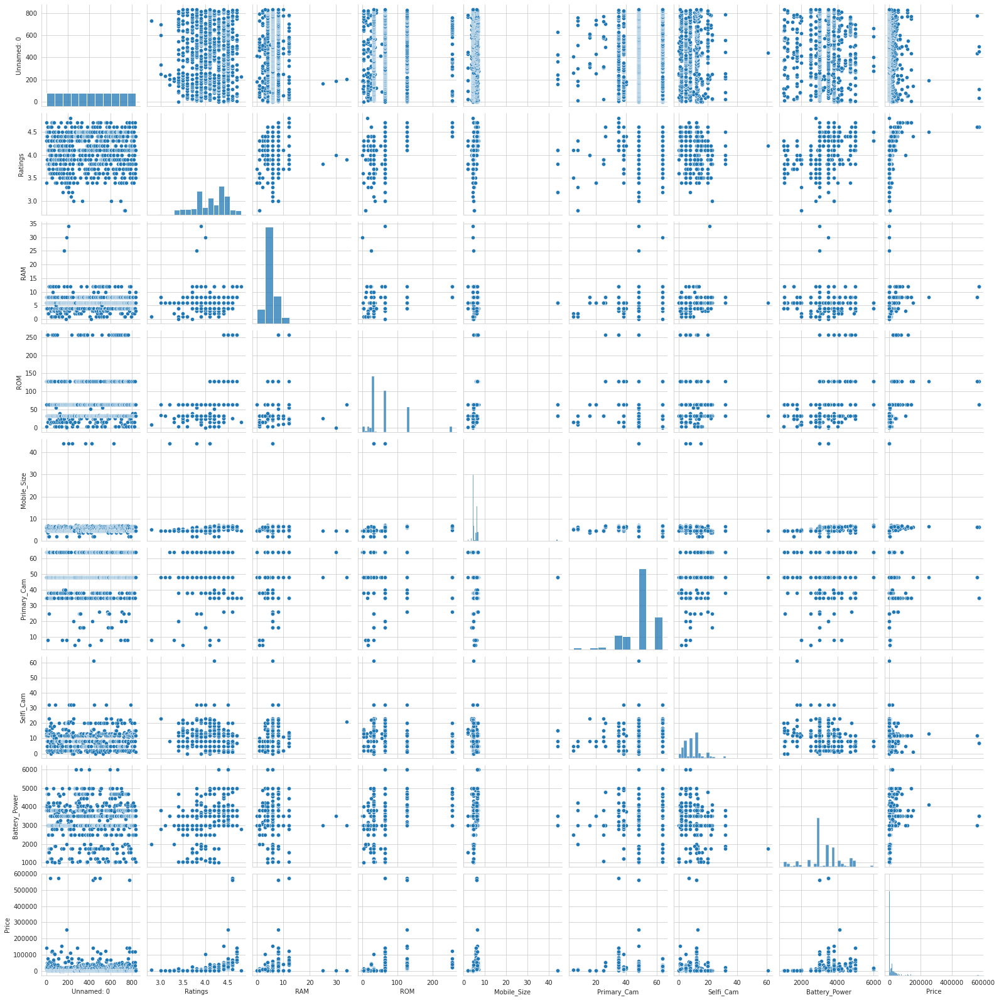

In [267]:
plt.figure(figsize=(10,10))
sns.pairplot(data=df)

If you need to do further analysis about the data, please follow the Auto EDA library (Pandas Profiling)

In [4]:
pip install pandas-profiling

     |████████████████████████████████| 261 kB 27.8 MB/s            
     |████████████████████████████████| 11.0 MB 89.3 MB/s            
     |████████████████████████████████| 675 kB 94.8 MB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 3.1 MB 56.0 MB/s            
     |████████████████████████████████| 102 kB 26.4 MB/s            
     |████████████████████████████████| 812 kB 75.8 MB/s            
  Preparing metadata (setup.py) ... done
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27085 sha256=cd1c51405fbf9a35a63cf35be9beca58a19527ef00cb9629e8aa5730de76bdcb
  Stored in directory: /home/ec2-user/.cache/pip/wheels/c3/fe/0b/4450b38bceb9ae43dd7d0f16e353566f30f5f4d59a58eca2ed
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295198 sha256=0ec590f09e97cae5ecf323cd192198f7e840a76ede72cb1c2bc27cd75dc3a6b7
  Stored in directory: /home/ec2-user/.cache/pip/wheels/5e/77/4c/72916017

In [6]:
#importing required packages
import pandas as pd
import pandas_profiling
import numpy as np

#descriptive statistics
profile = pandas_profiling.ProfileReport(df)

In [7]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile.to_file("EDA_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [273]:
df.describe()

,Unnamed: 0,Ratings,RAM,ROM,Mobile_Size,Primary_Cam,Selfi_Cam,Battery_Power,Price
count,836.000000,805.000000,829.000000,832.000000,834.000000,836.000000,567.000000,836.000000,836.00000
mean,417.500000,4.103106,6.066345,64.373077,5.597282,47.983254,9.784832,3274.688995,18220.34689
std,241.476707,0.365356,2.530336,53.447825,3.898664,11.170093,6.503838,927.518852,52805.55022
min,0.000000,2.800000,0.000000,0.000000,2.000000,5.000000,0.000000,1020.000000,479.00000
25%,208.750000,3.800000,6.000000,32.000000,4.500000,48.000000,5.000000,3000.000000,984.75000
50%,417.500000,4.100000,6.000000,40.000000,4.770000,48.000000,8.000000,3000.000000,1697.00000
75%,626.250000,4.400000,6.000000,64.000000,6.300000,48.000000,13.000000,3800.000000,18999.00000
max,835.000000,4.800000,34.000000,256.000000,44.000000,64.000000,61.000000,6000.000000,573000.00000


## 4. Data Preprocessing

### 4.1 Drop unnecessary columns

We can see Unnamed: 0 column is useless because it doesn't give any meaningful thing and it's just an index column. Therefore we can remove that column from the dataset.

In [40]:
df.drop(['Unnamed: 0'], axis = 1, inplace = True)

In [41]:
df.columns

Index(['Brand me', 'Ratings', 'RAM', 'ROM', 'Mobile_Size', 'Primary_Cam',
       'Selfi_Cam', 'Battery_Power', 'Price'],
      dtype='object')

### 4.2 Dealing with missing values

To check the number of missing values in the dataset,

In [307]:
df.isnull().sum()

Brand me           0
Ratings           31
RAM                7
ROM                4
Mobile_Size        2
Primary_Cam        0
Selfi_Cam        269
Battery_Power      0
Price              0
dtype: int64

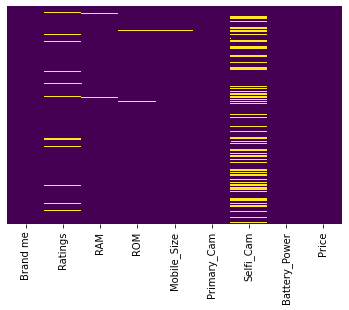

In [105]:
# To visulize it
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
plt.show()

We can see <b> Ratings, RAM, ROM, Mobile_Size, Selfi_Cam </b> variables have missing values and we need to treat them first.

In here we will apply bellow techniques to deal with missing values and among them we will find what is the most appropriate missing value technique for each variable.

* Mean/Medain/Mode Imputation
* Random number Imputation

#### 4.2.1 Mean/Medain/Mode Imputation

When the data follow <b>normal distribution</b>, <b>mean value replacement</b> is the best method. But when the data <b>skewed</b> it's better to do the <b>meadian</b> value replacement.

In [42]:
missing_var = ['Ratings', 'RAM', 'ROM', 'Mobile_Size', 'Selfi_Cam']

Put all the missing value variables into an another dataframe and name it as df_missing. 

In [43]:
df_missing= df[['Ratings', 'RAM', 'ROM', 'Mobile_Size', 'Selfi_Cam']]
df_missing.head()

,Ratings,RAM,ROM,Mobile_Size,Selfi_Cam
0,4.3,4.0,128.0,6.00,13.0
1,3.4,6.0,64.0,4.50,12.0
2,4.3,4.0,4.0,4.50,16.0
3,4.4,6.0,64.0,6.40,15.0
4,4.5,6.0,128.0,6.18,15.0


To look at the distributions of the variables which has the missing values.

<Figure size 360x360 with 0 Axes>

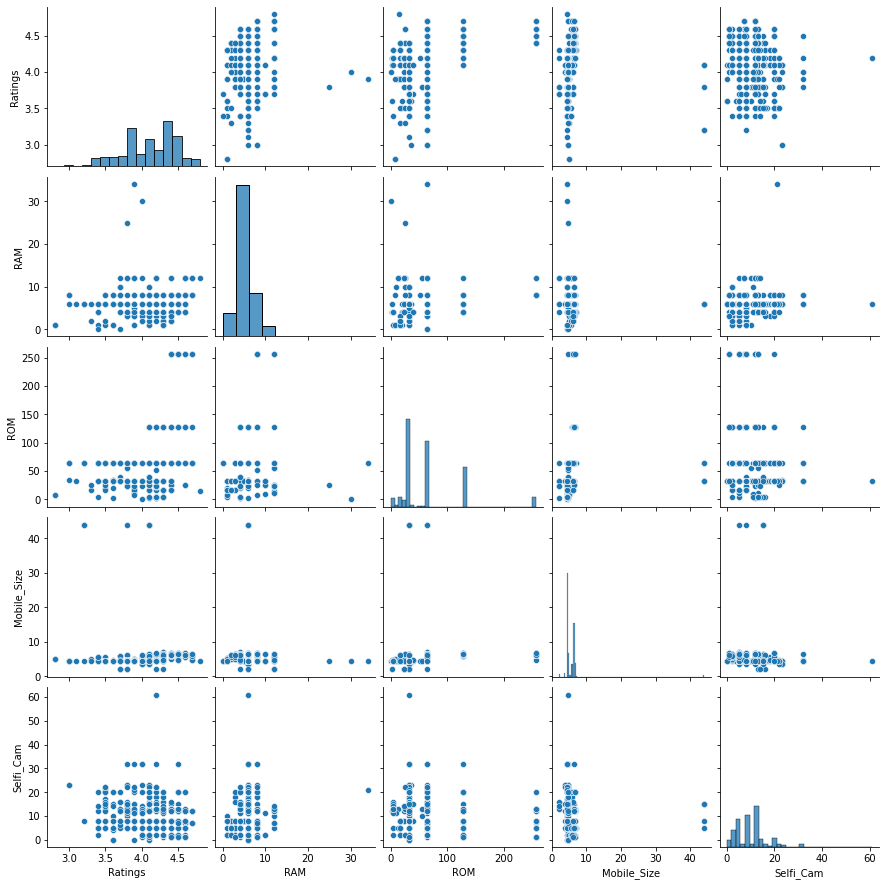

In [108]:
plt.figure(figsize=(5,5))
sns.pairplot(data=df_missing)

By looking at the above graph's diagonal(histograms), it shows all the varbales are skewed. Therefore we will use median imputation technique.

In [44]:
# If the variable has a missing value, this function will repalce that missing value by it's median 
def impute_nan(df,variable):
    df[variable+"_median"]=df[variable].fillna(df[variable].median())

In [45]:
# run above function for all the missing value variable
for i in missing_var:
    impute_nan(df_missing,i)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


In [51]:
df_missing.head()

,Ratings,RAM,ROM,Mobile_Size,Selfi_Cam,Ratings_median,RAM_median,ROM_median,Mobile_Size_median,Selfi_Cam_median
0,4.3,4.0,128.0,6.00,13.0,4.3,4.0,128.0,6.00,13.0
1,3.4,6.0,64.0,4.50,12.0,3.4,6.0,64.0,4.50,12.0
2,4.3,4.0,4.0,4.50,16.0,4.3,4.0,4.0,4.50,16.0
3,4.4,6.0,64.0,6.40,15.0,4.4,6.0,64.0,6.40,15.0
4,4.5,6.0,128.0,6.18,15.0,4.5,6.0,128.0,6.18,15.0


In [52]:
df_missing.isnull().sum()

Ratings                31
RAM                     7
ROM                     4
Mobile_Size             2
Selfi_Cam             269
Ratings_median          0
RAM_median              0
ROM_median              0
Mobile_Size_median      0
Selfi_Cam_median        0
dtype: int64

#### 4.2.2 Random number Imputation

In [46]:
# If the variable has a missing value, this function will repalce that missing value by a random number (this random number will choose from the relavant variable) 
def impute_nan_random(df,variable):
    df[variable+"_random"]=df[variable]
    ##It will have the random sample to fill the na
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
    ##pandas need to have same index in order to merge the dataset
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable+'_random']=random_sample

In [47]:
for i in missing_var:
    impute_nan_random(df_missing,i)

In [55]:
df_missing.head()

,Ratings,RAM,ROM,Mobile_Size,Selfi_Cam,Ratings_median,RAM_median,ROM_median,Mobile_Size_median,Selfi_Cam_median,Ratings_random,RAM_random,ROM_random,Mobile_Size_random,Selfi_Cam_random
0,4.3,4.0,128.0,6.00,13.0,4.3,4.0,128.0,6.00,13.0,4.3,4.0,128.0,6.00,13.0
1,3.4,6.0,64.0,4.50,12.0,3.4,6.0,64.0,4.50,12.0,3.4,6.0,64.0,4.50,12.0
2,4.3,4.0,4.0,4.50,16.0,4.3,4.0,4.0,4.50,16.0,4.3,4.0,4.0,4.50,16.0
3,4.4,6.0,64.0,6.40,15.0,4.4,6.0,64.0,6.40,15.0,4.4,6.0,64.0,6.40,15.0
4,4.5,6.0,128.0,6.18,15.0,4.5,6.0,128.0,6.18,15.0,4.5,6.0,128.0,6.18,15.0


In [56]:
df_missing.isnull().sum()

Ratings                31
RAM                     7
ROM                     4
Mobile_Size             2
Selfi_Cam             269
Ratings_median          0
RAM_median              0
ROM_median              0
Mobile_Size_median      0
Selfi_Cam_median        0
Ratings_random          0
RAM_random              0
ROM_random              0
Mobile_Size_random      0
Selfi_Cam_random        0
dtype: int64

In [117]:
#Comparison of the distrbutions before and after deali with missing values
def comparison_plot(df, variable):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    df[variable].plot(kind='kde', ax=ax)
    df[variable+"_median"].plot(kind='kde', ax=ax, color='red')
    df[variable+"_random"].plot(kind='kde', ax=ax, color='green')
    lines, labels = ax.get_legend_handles_labels()
    ax.legend(lines, labels, loc='best')

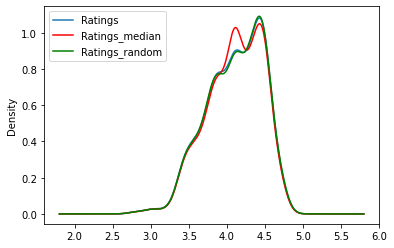

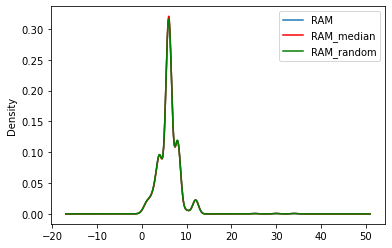

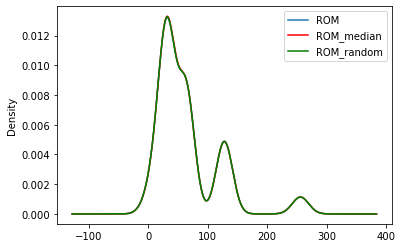

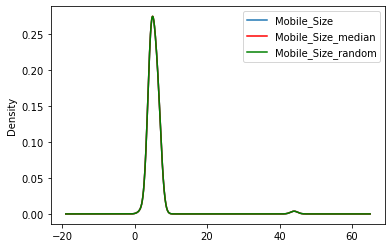

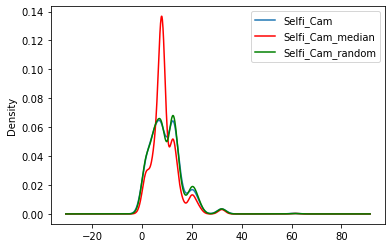

In [118]:
for i in missing_var:
    comparison_plot(df_missing,i)

In [119]:
df.columns[0]

'Brand me'

In [57]:
#Compare the standard values before and after imputation
def compare_std(df, variable):
    print("original std of ", variable, "is ", df[variable].std(), 
          "and after median repalcement std: ", df[variable+"_median"].std(),
          "and after random number repalcement std: ", df[variable+"_random"].std())

In [58]:
for i in missing_var:
    compare_std(df_missing,i)

original std of  Ratings is  0.3653564946598119 and after median repalcement std:  0.3585107652087913 and after random number repalcement std:  0.36542744482477796
original std of  RAM is  2.5303355225505064 and after median repalcement std:  2.519714264512406 and after random number repalcement std:  2.5286406301372475
original std of  ROM is  53.447824878694796 and after median repalcement std:  53.346203756528766 and after random number repalcement std:  53.3748885704559
original std of  Mobile_Size is  3.8986644597820286 and after median repalcement std:  3.8942025791509747 and after random number repalcement std:  3.8943619988146203
original std of  Selfi_Cam is  6.503838165404479 and after median repalcement std:  5.41929877785105 and after random number repalcement std:  6.401874720946859


By looking at the kernel density plots and the standard values, we can obtained random number imputation method is the best method as it doesn't distrote the original distribution's behaviors.

In [122]:
#Combine df_missing and df dataframes
df_missing.head()

,Ratings,RAM,ROM,Mobile_Size,Selfi_Cam,Ratings_median,RAM_median,ROM_median,Mobile_Size_median,Selfi_Cam_median,Ratings_random,RAM_random,ROM_random,Mobile_Size_random,Selfi_Cam_random
0,4.3,4.0,128.0,6.00,13.0,4.3,4.0,128.0,6.00,13.0,4.3,4.0,128.0,6.00,13.0
1,3.4,6.0,64.0,4.50,12.0,3.4,6.0,64.0,4.50,12.0,3.4,6.0,64.0,4.50,12.0
2,4.3,4.0,4.0,4.50,16.0,4.3,4.0,4.0,4.50,16.0,4.3,4.0,4.0,4.50,16.0
3,4.4,6.0,64.0,6.40,15.0,4.4,6.0,64.0,6.40,15.0,4.4,6.0,64.0,6.40,15.0
4,4.5,6.0,128.0,6.18,15.0,4.5,6.0,128.0,6.18,15.0,4.5,6.0,128.0,6.18,15.0


In [123]:
df_missing.columns

Index(['Ratings', 'RAM', 'ROM', 'Mobile_Size', 'Selfi_Cam', 'Ratings_median',
       'RAM_median', 'ROM_median', 'Mobile_Size_median', 'Selfi_Cam_median',
       'Ratings_random', 'RAM_random', 'ROM_random', 'Mobile_Size_random',
       'Selfi_Cam_random'],
      dtype='object')

In [48]:
df_new = pd.concat([df, df_missing[['Ratings_random', 'RAM_random', 'ROM_random', 'Mobile_Size_random',
       'Selfi_Cam_random']]], axis = 1)

In [60]:
df_new.head()

,Brand me,Ratings,RAM,ROM,Mobile_Size,Primary_Cam,Selfi_Cam,Battery_Power,Price,Ratings_random,RAM_random,ROM_random,Mobile_Size_random,Selfi_Cam_random
0,"LG V30+ (Black, 128 )",4.3,4.0,128.0,6.00,48,13.0,4000,24999,4.3,4.0,128.0,6.00,13.0
1,I Kall K11,3.4,6.0,64.0,4.50,48,12.0,4000,15999,3.4,6.0,64.0,4.50,12.0
2,Nokia 105 ss,4.3,4.0,4.0,4.50,64,16.0,4000,15000,4.3,4.0,4.0,4.50,16.0
3,"Samsung Galaxy A50 (White, 64 )",4.4,6.0,64.0,6.40,48,15.0,3800,18999,4.4,6.0,64.0,6.40,15.0
4,"POCO F1 (Steel Blue, 128 )",4.5,6.0,128.0,6.18,35,15.0,3800,18999,4.5,6.0,128.0,6.18,15.0


In [49]:
#remove the unnecessary columns
df_new.drop(['Ratings', 'RAM', 'ROM', 'Mobile_Size','Selfi_Cam'], axis = 1, inplace = True)

In [62]:
df_new.head()

,Brand me,Primary_Cam,Battery_Power,Price,Ratings_random,RAM_random,ROM_random,Mobile_Size_random,Selfi_Cam_random
0,"LG V30+ (Black, 128 )",48,4000,24999,4.3,4.0,128.0,6.00,13.0
1,I Kall K11,48,4000,15999,3.4,6.0,64.0,4.50,12.0
2,Nokia 105 ss,64,4000,15000,4.3,4.0,4.0,4.50,16.0
3,"Samsung Galaxy A50 (White, 64 )",48,3800,18999,4.4,6.0,64.0,6.40,15.0
4,"POCO F1 (Steel Blue, 128 )",35,3800,18999,4.5,6.0,128.0,6.18,15.0


In [26]:
df_new.isnull().sum()

Brand me              0
Primary_Cam           0
Battery_Power         0
Price                 0
Ratings_random        0
RAM_random            0
ROM_random            0
Mobile_Size_random    0
Selfi_Cam_random      0
dtype: int64

Now we have a clean dataset

## 4.3 Modify Variables(Feature Engineering)

In [50]:
df_new['Brand me'].dtype

dtype('O')

In [51]:
df_new['Brand me'] = df_new['Brand me'].str.split(' ',1).str[0]

<a href="https://stackoverflow.com/questions/14745022/how-to-split-a-dataframe-string-column-into-two-columns">Need more details about this method, click here</a>

In [52]:
df_new['Brand me'].value_counts()

Samsung     70
I           61
Kechaoda    49
OPPO        47
Micax       42
            ..
Yuho         1
Callbar      1
Q-Tel        1
Ecotel       1
F-Fook       1
Name: Brand me, Length: 71, dtype: int64

In [66]:
df_new.head()

,Brand me,Primary_Cam,Battery_Power,Price,Ratings_random,RAM_random,ROM_random,Mobile_Size_random,Selfi_Cam_random
0,LG,48,4000,24999,4.3,4.0,128.0,6.00,13.0
1,I,48,4000,15999,3.4,6.0,64.0,4.50,12.0
2,Nokia,64,4000,15000,4.3,4.0,4.0,4.50,16.0
3,Samsung,48,3800,18999,4.4,6.0,64.0,6.40,15.0
4,POCO,35,3800,18999,4.5,6.0,128.0,6.18,15.0


In [15]:
import seaborn as sns

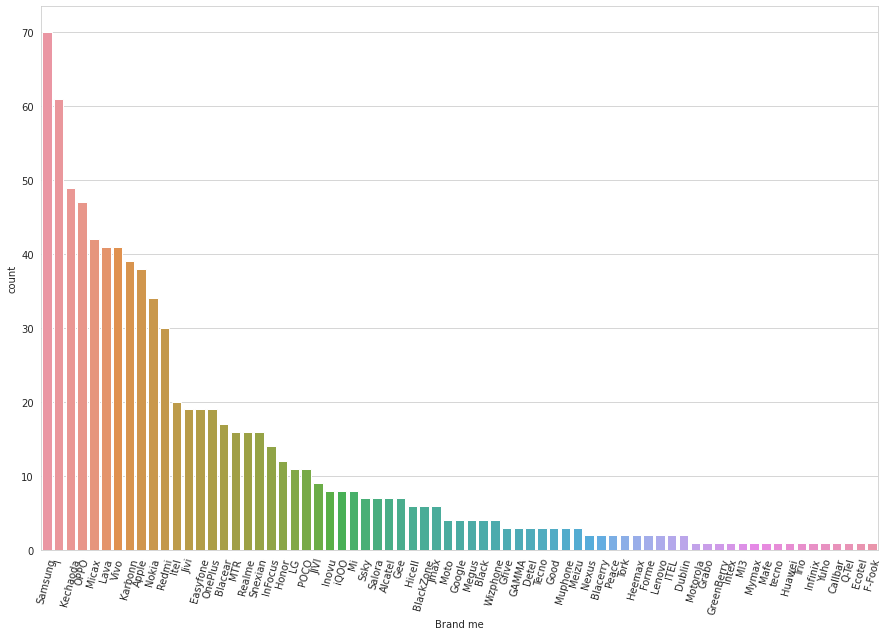

In [16]:
plt.figure(figsize=(15,10))
sns.set_style('whitegrid')
sns.countplot(x='Brand me',
              data=df_new,
             order = df_new['Brand me'].value_counts().index)
plt.xticks(rotation=75)
plt.show()

In this chart we can see, there are 71 mobile products in this datset and there are only few companies has sales more than 20. Therefore we select only the top 10 brands in the dataset and we rename other variables as Other category.

In [53]:
#Get the list of top 10 elements
top10 = df_new['Brand me'].value_counts().index[:10]
top10

Index(['Samsung', 'I', 'Kechaoda', 'OPPO', 'Micax', 'Lava', 'Vivo', 'Karbonn',
       'Apple', 'Nokia'],
      dtype='object')

In [54]:
df_new['Brand me'] = np.where(df_new['Brand me'].isin(top10), df_new['Brand me'], 'Other')
df_new['Brand me'].nunique()

11

In [71]:
df_new['Brand me'].value_counts()

Other       374
Samsung      70
I            61
Kechaoda     49
OPPO         47
Micax        42
Vivo         41
Lava         41
Karbonn      39
Apple        38
Nokia        34
Name: Brand me, dtype: int64

Now we have a categorical feature and it has 11 categories. Therefore we need to encode them.

### 4.4 Handling Categorical Data

In [55]:
brand_list = df_new['Price'].groupby(df_new['Brand me']).mean().sort_values(ascending=False)
brand_list

Brand me
Apple       137748.947368
Samsung      47688.500000
Vivo         25629.829268
OPPO         21062.382979
Other        11145.457219
Nokia         3686.294118
Lava          1734.682927
Micax         1684.452381
Karbonn       1530.615385
I             1213.098361
Kechaoda      1010.265306
Name: Price, dtype: float64

We an see there's a relationship between price and the brand. Therefore we will use nominal encoding method to encode the Brand me variable.

In [20]:
#get the list
brand_list.index

Index(['Apple', 'Samsung', 'Vivo', 'OPPO', 'Other', 'Nokia', 'Lava', 'Micax',
       'Karbonn', 'I', 'Kechaoda'],
      dtype='object', name='Brand me')

In [21]:
brand_list.nunique()

11

In [56]:
#First convert to Categorical
df_new['Brand me'] = df_new['Brand me'].astype('category')

#rename the columns using a dictionary
df_new['Brand me'] = df_new['Brand me'].cat.rename_categories({'Apple': 11, 
                                                               'Samsung': 10, 
                                                               'Vivo': 9, 
                                                               'OPPO': 8, 
                                                               'Other': 7, 
                                                               'Nokia': 6, 
                                                               'Lava': 5,
                                                               'Micax': 4, 
                                                               'Karbonn': 3, 
                                                               'I': 2,
                                                               'Kechaoda':1
                                                              })

In [76]:
df_new['Brand me'].value_counts()

7     374
10     70
2      61
1      49
8      47
4      42
9      41
5      41
3      39
11     38
6      34
Name: Brand me, dtype: int64

In [77]:
df_new.head()

,Brand me,Primary_Cam,Battery_Power,Price,Ratings_random,RAM_random,ROM_random,Mobile_Size_random,Selfi_Cam_random
0,7,48,4000,24999,4.3,4.0,128.0,6.00,13.0
1,2,48,4000,15999,3.4,6.0,64.0,4.50,12.0
2,6,64,4000,15000,4.3,4.0,4.0,4.50,16.0
3,10,48,3800,18999,4.4,6.0,64.0,6.40,15.0
4,7,35,3800,18999,4.5,6.0,128.0,6.18,15.0


In [78]:
df_new.shape

(836, 9)

### 4.5 Feature Selection

Understanding the correlation of features between target and other features.

In [238]:
corr = df_new.corr()
corr.shape

(8, 8)

<AxesSubplot:>

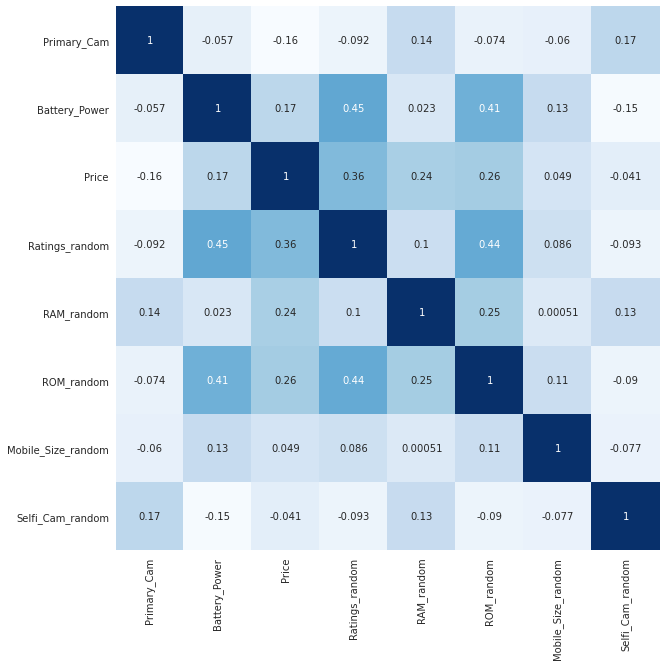

In [247]:
# Plotting the heatmap of correlation between features
plt.figure(figsize=(10,10))
sns.heatmap(corr, cbar=False, square= True, annot=True, cmap='Blues')

By looking at the above heatmap there's no multicollinearity in the dataset. You can confirm it by using the bellow function.

In [248]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [249]:
corr_features = correlation(df_new, 0.7)
len(set(corr_features))

0

This function also implies, there's no inter correlation between independent variables.

### 4.6 Feature Importance

In [250]:
df_new.head()

,Brand me,Primary_Cam,Battery_Power,Price,Ratings_random,RAM_random,ROM_random,Mobile_Size_random,Selfi_Cam_random
0,7,48,4000,24999,4.3,4.0,128.0,6.00,13.0
1,2,48,4000,15999,3.4,6.0,64.0,4.50,12.0
2,6,64,4000,15000,4.3,4.0,4.0,4.50,16.0
3,10,48,3800,18999,4.4,6.0,64.0,6.40,15.0
4,7,35,3800,18999,4.5,6.0,128.0,6.18,15.0


In [251]:
df_new.columns

Index(['Brand me', 'Primary_Cam', 'Battery_Power', 'Price', 'Ratings_random',
       'RAM_random', 'ROM_random', 'Mobile_Size_random', 'Selfi_Cam_random'],
      dtype='object')

In [57]:
X = df_new[['Brand me', 'Primary_Cam', 'Battery_Power', 'Ratings_random',
       'RAM_random', 'ROM_random', 'Mobile_Size_random', 'Selfi_Cam_random']]
y = df_new['Price']

In [24]:
# Fiting Feature Seclection using Ensemble Methods
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)

ExtraTreesClassifier()

In [256]:
print(model.feature_importances_)

[0.09366275 0.07360692 0.13502749 0.16822716 0.08817102 0.0840024
 0.1714949  0.18580736]


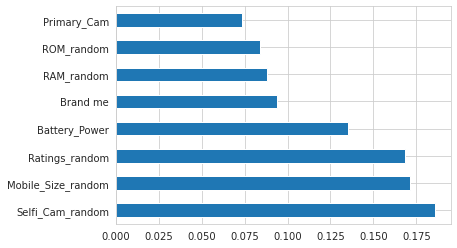

In [259]:
# Plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

### 4.7 Dealing with outliers

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='ROM_random', ylabel='Density'>

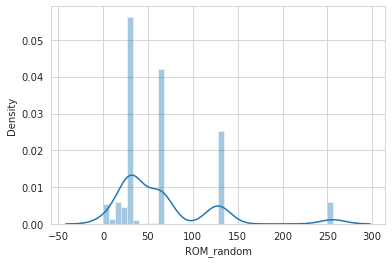

In [274]:
sns.distplot(df_new['ROM_random'])

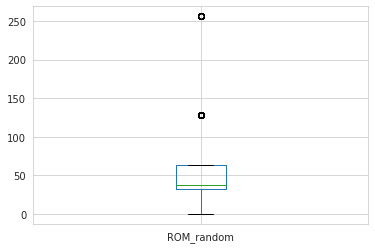

In [275]:
figure=df_new.boxplot(column="ROM_random")

In [276]:
df_new['ROM_random'].describe()

count    836.000000
mean      64.228947
std       53.374889
min        0.000000
25%       32.000000
50%       37.500000
75%       64.000000
max      256.000000
Name: ROM_random, dtype: float64

In [277]:
df_new.loc[df_new['ROM_random']>64, :]

,Brand me,Primary_Cam,Battery_Power,Price,Ratings_random,RAM_random,ROM_random,Mobile_Size_random,Selfi_Cam_random
0,7,48,4000,24999,4.3,4.0,128.0,6.00,13.0
4,7,35,3800,18999,4.5,6.0,128.0,6.18,15.0
5,11,35,5000,140300,4.7,8.0,128.0,5.80,12.0
6,10,64,4700,29999,4.4,8.0,128.0,6.70,5.0
7,10,48,4700,47999,4.5,8.0,128.0,6.70,12.0
...,...,...,...,...,...,...,...,...,...
793,7,48,4030,24999,4.5,6.0,128.0,6.39,13.0
797,9,48,4100,29499,4.5,8.0,128.0,6.44,13.0
808,7,48,3800,31999,4.4,6.0,128.0,6.39,12.0
817,7,48,3800,24999,4.5,6.0,128.0,6.39,13.0


In [280]:
outliers = df_new.loc[df_new['ROM_random']>64, :]
outliers['Brand me'].value_counts()

7     82
10    41
8     28
9     20
11     4
6      0
4      0
5      0
1      0
3      0
2      0
Name: Brand me, dtype: int64

We can see 7-11 categories have the outliers and it may be can occure becuase their avergae prices are higher than the others. So usually when the prices are increasing, features also increasing. TBy looking at the above stats it is unfair to replace them with other values. So we don't touch with these outliers as it give us very usefull information.

### 4.8 Transform the data

We can clearly see the scales of the variables are very different. Therefore we need to apply a transformation technique at the end.

In [58]:
#### standarisation: We use the Standardscaler from sklearn library
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
### fit vs fit_transform
X=scaler.fit_transform(X)

In [81]:
X

array([[ 2.33198741e-01,  1.50011610e-03,  7.82458698e-01, ...,
         1.19549153e+00,  1.04146956e-01,  5.00115412e-01],
       [-1.69322564e+00,  1.50011610e-03,  7.82458698e-01, ...,
        -4.29198876e-03, -2.81255822e-01,  3.43817661e-01],
       [-1.52086136e-01,  1.43475390e+00,  7.82458698e-01, ...,
        -1.12908904e+00, -2.81255822e-01,  9.69008666e-01],
       ...,
       [ 2.33198741e-01,  1.50011610e-03,  5.66700577e-01, ...,
        -6.04183751e-01,  1.55533994e-01, -1.37545760e+00],
       [ 2.33198741e-01,  1.43475390e+00,  2.43063395e-01, ...,
        -6.04183751e-01, -2.81255822e-01,  5.00115412e-01],
       [ 2.33198741e-01,  1.43475390e+00, -2.39997359e+00, ...,
        -6.04183751e-01, -2.81255822e-01,  8.12710915e-01]])

## 5. Model Fitting

### 5.1 Split the dataset

In [59]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)

### 5.2 Linear Regression

In [60]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

In [98]:
# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train, y_train)

LinearRegression()

In [99]:
# Make predictions using the testing set
y_pred_lr = regr.predict(X_test)

In [105]:
sns.histplot(y_test-y_pred_lr)
plt.show()

In [106]:
# Visualizing the differences between actual prices and predicted values
plt.scatter(y_test, y_pred_lr)
plt.xlabel("Prices")
plt.ylabel("Predicted prices")
plt.title("Prices vs Predicted prices")
plt.show()

In [107]:
# The coefficients
print("Coefficients: \n", regr.coef_)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_pred_lr))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred_lr))

Coefficients: 
 [13006.94411856 -9097.21136085 -3291.94295405 10945.45868504
 14048.72045397  2265.90473161  1245.04370018   456.34746375]
Mean squared error: 1583034806.69
Coefficient of determination: 0.21


In [108]:
# Training Score
print("Training Accuracy:",regr.score(X_train,y_train)*100)

# Testing Score
print("Testing Accuracy:",regr.score(X_test,y_test)*100)

Training Accuracy: 23.25509459214755
Testing Accuracy: 21.41936328522397


We can see accuracies are really poor. Therefore linear regression is not a good model.

### 5.2 Elastic Net Regression

In [109]:
from sklearn.linear_model import ElasticNet

In [110]:
EN_model = ElasticNet(alpha=1.0, l1_ratio=0.5)

In [112]:
EN_model.fit(X_train,y_train)

ElasticNet()

In [113]:
# Training Score
print("Training Accuracy:",EN_model.score(X_train,y_train)*100)

Training Accuracy: 21.271854293718352


In [114]:
# Testing Score
print("Testing Accuracy:",EN_model.score(X_test,y_test)*100)

Testing Accuracy: 26.068723599205313


### 5.3 ExtraTreesClassifier

In [84]:
from sklearn.ensemble import ExtraTreesClassifier

In [85]:
model = ExtraTreesClassifier()
model.fit(X_train,y_train)

ExtraTreesClassifier()

In [86]:
y_pred_etc = model.predict(X_test)

In [90]:
sns.histplot(y_test-y_pred_etc)
plt.show()

In [91]:
plt.scatter(y_test, y_pred_etc, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

In [93]:
from sklearn import metrics

In [94]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred_etc))
print('MSE:', metrics.mean_squared_error(y_test, y_pred_etc))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_etc)))

MAE: 4750.163346613545
MSE: 1269509395.2071712
RMSE: 35630.175346287186


In [95]:
# RMSE/(max(DV)-min(DV))

35630.175346287186/(max(y)-min(y))

0.06223383132895944

In [87]:
# Training Score
print("Training Accuracy:",model.score(X_train,y_train)*100)

Training Accuracy: 94.70085470085469


In [88]:
# Testing Score
print("Testing Accuracy:",model.score(X_test,y_test)*100)

Testing Accuracy: 51.79282868525896


We can see there's an overfitting issue in this model as it has massive difference between training accuracy and testing accuracy.

### 5.4 Random Forest Regressor

In [119]:
from sklearn.ensemble import RandomForestRegressor
reg = RandomForestRegressor()
reg.fit(X_train,y_train)

RandomForestRegressor()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
reg = RandomForestRegressor()
reg.fit(X_train,y_train)

In [120]:
y_pred = reg.predict(X_test)

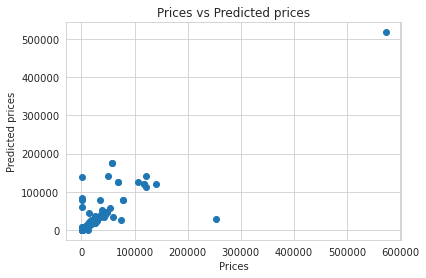

In [359]:
# Visualizing the differences between actual prices and predicted values
plt.scatter(y_test, y_pred)
plt.xlabel("Prices")
plt.ylabel("Predicted prices")
plt.title("Prices vs Predicted prices")
plt.show()

In [124]:
# Training Score
print("Training Accuracy:",reg.score(X_train,y_train)*100)

Training Accuracy: 96.5358823396144


In [123]:
# Testing Score
print("Testing Accuracy:",reg.score(X_test,y_test)*100)

Testing Accuracy: 85.1087466171355


In [125]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE: 5475.739216847009
MSE: 473643032.370614
RMSE: 21763.341479897197


This is a good model. Therefore we will optimize this model to improve the performances.

### 5.5 Support Vector Regressor

In [354]:
from sklearn.svm import SVR
regressor = SVR(kernel = 'rbf')
regressor.fit(X_train, y_train)

SVR()

In [360]:
y_pred = reg.predict(X_test)

In [365]:
# Training Score
print("Training Accuracy:",regressor.score(X_train,y_train)*100)

Training Accuracy: -8.688826005404081


In [366]:
# Testing Score
print("Testing Accuracy:",regressor.score(X_test,y_test)*100)

Testing Accuracy: -13.151549944099305


## 6. Hyper-Parameter Tuning

### 6.1 Randomized Search

In [126]:
from sklearn.model_selection import RandomizedSearchCV

In [127]:
#Randomized Search CV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

# Create the random grid

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [128]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
rf_random = RandomizedSearchCV(estimator = reg, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 3, verbose=2, random_state=42, n_jobs = 1)
rf_random.fit(X_train,y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   2.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   1.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   1.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   1.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   1.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   1.2s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=100, n_estimators=300; total time=   0.3s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=5, min_samples_split=100, n_esti

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [129]:
rf_random.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 25}

In [132]:
best_random_grid=rf_random.best_estimator_

In [36]:
prediction = best_random_grid.predict(X_test)

NameError: name 'best_random_grid' is not defined

In [35]:
plt.figure(figsize = (8,8))
sns.distplot(y_test-prediction)
plt.show()

NameError: name 'prediction' is not defined

<Figure size 576x576 with 0 Axes>

In [135]:
plt.figure(figsize = (8,8))
plt.scatter(y_test, prediction, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

In [136]:
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 5106.854382343392
MSE: 453312645.7622481
RMSE: 21291.140076619853


In [137]:
# Training Score
print("Training Accuracy:",best_random_grid.score(X_train,y_train)*100)

# Testing Score
print("Testing Accuracy:",best_random_grid.score(X_test,y_test)*100)

Training Accuracy: 96.94848797262244
Testing Accuracy: 85.74793038564046


### 6.2 Grid Search

In [138]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [rf_random.best_params_['n_estimators']+50,
                    rf_random.best_params_['n_estimators']-50],
    'min_samples_split': [rf_random.best_params_['min_samples_split']+1,
                         rf_random.best_params_['min_samples_split']+2,
                         rf_random.best_params_['min_samples_split']+3],
    'min_samples_leaf': [rf_random.best_params_['min_samples_leaf']],
    'max_features': [rf_random.best_params_['max_features']],
    'max_depth': [rf_random.best_params_['max_depth'] - 2,
                          rf_random.best_params_['max_depth'] - 1,
                          rf_random.best_params_['max_depth'], 
                          rf_random.best_params_['max_depth'] +1,
                          rf_random.best_params_['max_depth'] + 2]
}

print(param_grid)


{'n_estimators': [1050, 950], 'min_samples_split': [3, 4, 5], 'min_samples_leaf': [1], 'max_features': ['sqrt'], 'max_depth': [23, 24, 25, 26, 27]}


In [139]:
#### Fit the grid_search to the data
grid_search=GridSearchCV(estimator=reg,param_grid=param_grid,cv=5,n_jobs=-1,verbose=2)
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [23, 24, 25, 26, 27],
                         'max_features': ['sqrt'], 'min_samples_leaf': [1],
                         'min_samples_split': [3, 4, 5],
                         'n_estimators': [1050, 950]},
             verbose=2)

In [140]:
grid_search.best_estimator_

RandomForestRegressor(max_depth=24, max_features='sqrt', min_samples_split=3,
                      n_estimators=1050)

In [141]:
best_grid=grid_search.best_estimator_

In [142]:
best_grid

RandomForestRegressor(max_depth=24, max_features='sqrt', min_samples_split=3,
                      n_estimators=1050)

In [143]:
# Training Score
print("Training Accuracy:",best_grid.score(X_train,y_train)*100)

# Testing Score
print("Testing Accuracy:",best_grid.score(X_test,y_test)*100)

Training Accuracy: 94.8966903971124
Testing Accuracy: 82.67800747109449


It reduce the both accuracies. Therefore we will go with the randomized search method's model as a best model.

## 7. Save the best model to reuse it again

In [144]:
import pickle
# open a file, where you ant to store the data
file = open('mobile_price_rg.pkl', 'wb')

# dump information to that file
pickle.dump(best_random_grid, file)

In [146]:
#Load the model
model = open('mobile_price_rg.pkl','rb')
reg_rand = pickle.load(model)

In [147]:
y_prediction = reg_rand.predict(X_test)

In [148]:
metrics.r2_score(y_test, y_prediction)

0.8574793038564046

In [149]:
plt.figure(figsize=(5,5))
sns.pairplot(data=df_missing)